### 3D Plot

Text(0.5, 0, 'total_price_w/oParking')

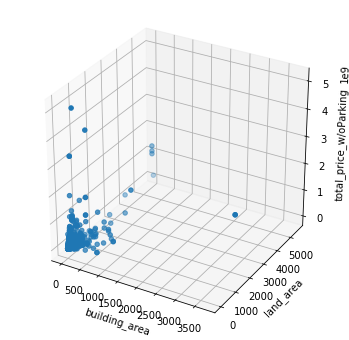

In [5]:
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm

threedee = plt.figure(figsize=(6, 6)).gca(projection='3d')
threedee.scatter(data_train['building_area'], data_train['land_area'], (data_train['total_price']-data_train['parking_price']))

threedee.set_xlabel('building_area')
threedee.set_ylabel('land_area')
threedee.set_zlabel('total_price_w/oParking')


### categorical variable to color scatterplot

In [ ]:
def scatterplot_cat(cat):
    plt.figure()
    sns.lmplot( x="sepal_length", y="sepal_width", data=df, fit_reg=False, hue='species', legend=False)
    #x,y are continuous, hue is categorical variales

### buildingUnit_price
> 無法取得building_price：來源資料經過不同的轉換, total_price - parking_price != building_price

### boxcox_total_price VS 

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


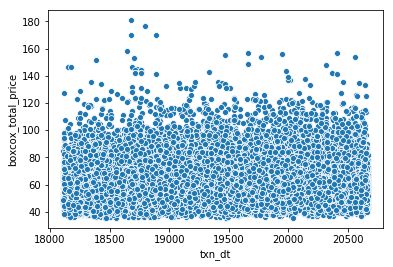

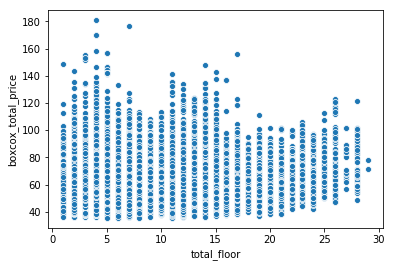

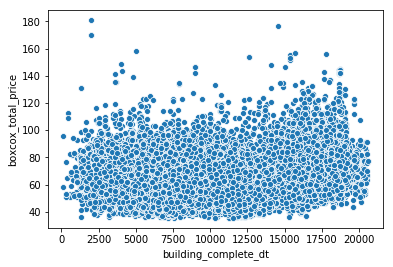

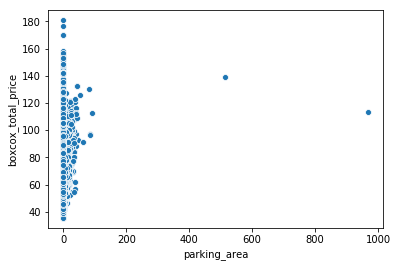

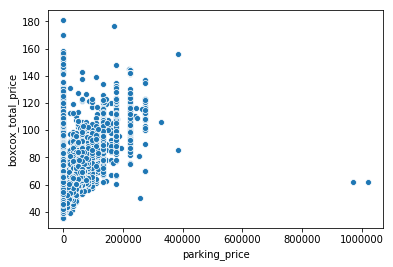

...

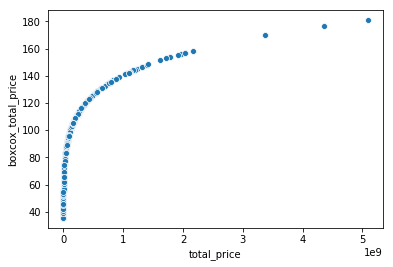

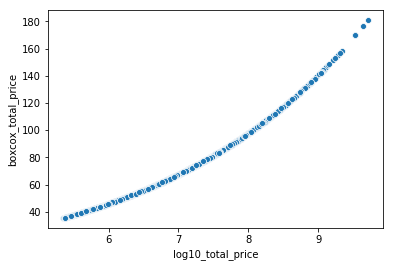

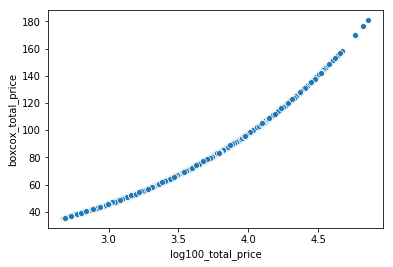

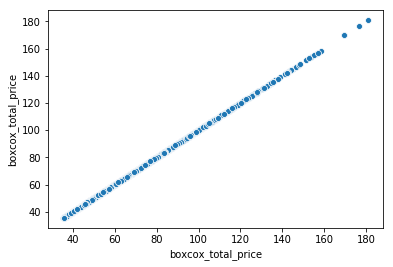

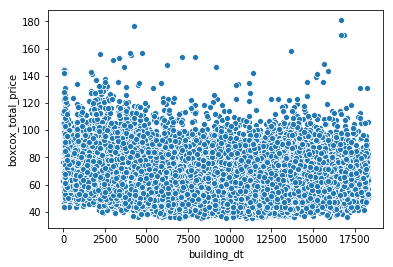

In [6]:
type(data_train['city'][0]) #numpy.int64 轉成category亦為int64
cat_columns = catData = ['building_material', 'city', 'town', 'village', 'building_type', 'building_use', 'parking_way']
con_select = [pd.np.dtype('float64'), pd.np.dtype('int64')]
con_columns = list(data_train.columns[data_train.dtypes.isin(con_select)])

#boxplot & violinPlot by group
def box_violin_plot(col):
    plt.figure(num=None, figsize=(20, 6))
    sns.boxplot(x=data_train[col], y=data_train["boxcox_total_price"])
    sns.violinplot(x=data_train[col], y=data_train["boxcox_total_price"])
#scatterplot
def scatterplot():
    plt.figure()
    sns.scatterplot(x=data_train[col], y=data_train["boxcox_total_price"])

for col in cat_columns:
    box_violin_plot(col)
for col in con_columns:
    scatterplot()

### total_price

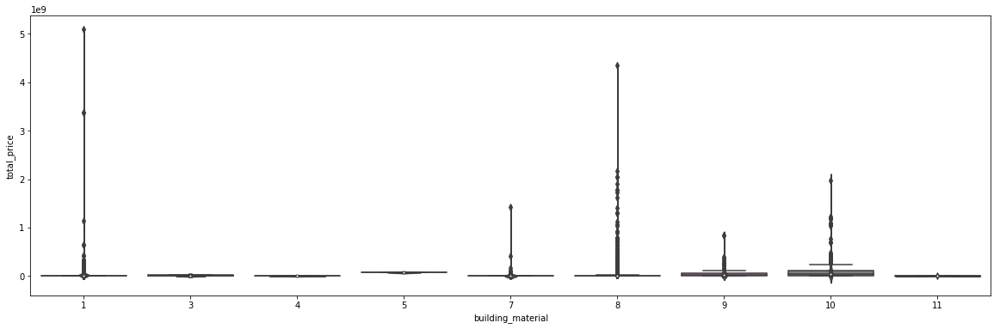

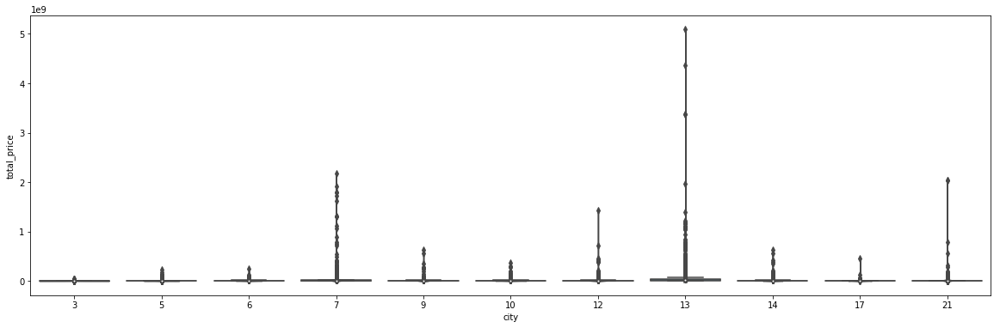

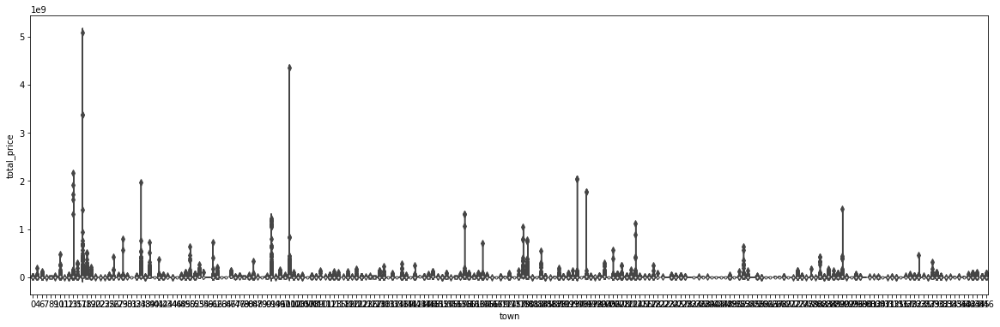

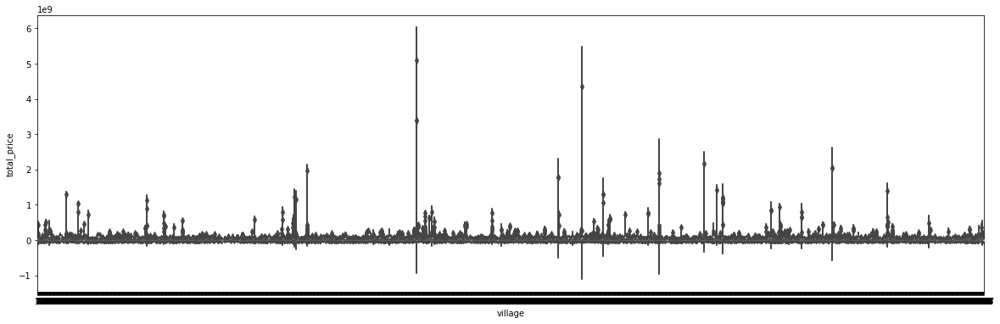

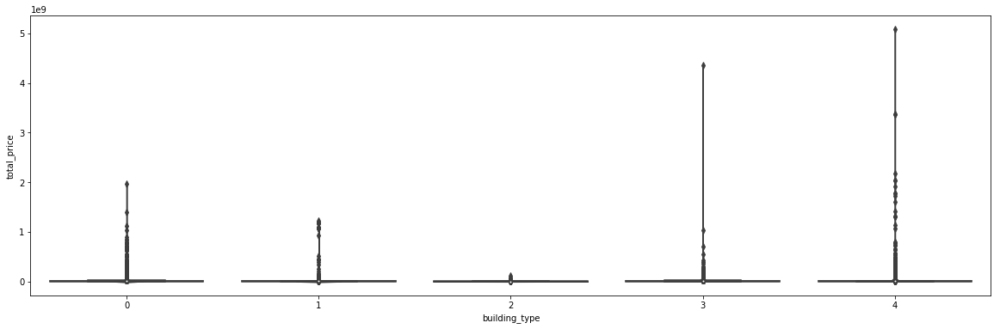

...

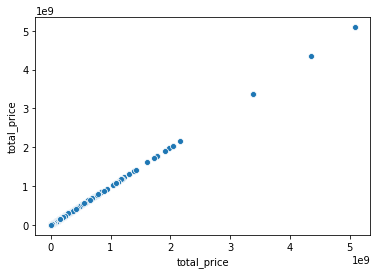

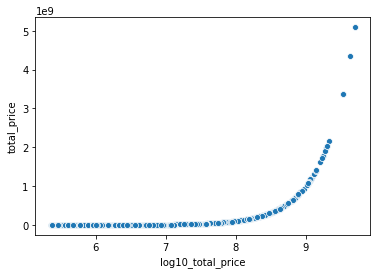

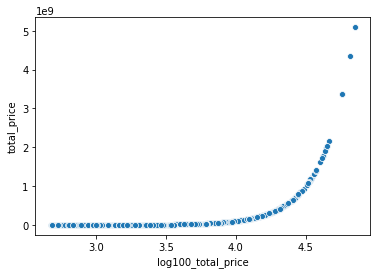

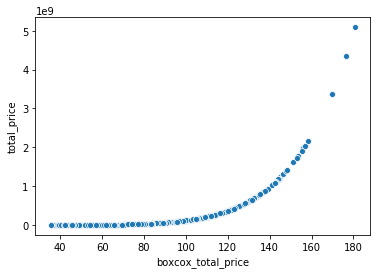

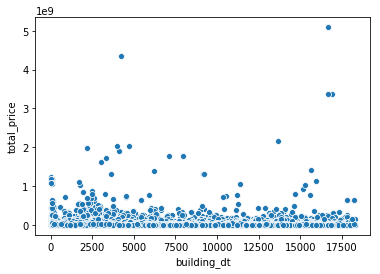

In [34]:
type(data_train['city'][0]) #numpy.int64 轉成category亦為int64
cat_columns = catData = ['building_material', 'city', 'town', 'village', 'building_type', 'building_use', 'parking_way']
con_select = [pd.np.dtype('float64'), pd.np.dtype('int64')]
con_columns = list(data_train.columns[data_train.dtypes.isin(con_select)])


#boxplot & violinPlot by group
def box_violin_plot(col):
    plt.figure(num=None, figsize=(20, 6))
    sns.boxplot(x=data_train[col], y=data_train["total_price"])
    sns.violinplot(x=data_train[col], y=data_train["total_price"])
#scatterplot
def scatterplot():
    plt.figure()
    sns.scatterplot(x=data_train[col], y=data_train["total_price"])

for col in cat_columns:
    box_violin_plot(col)
for col in con_columns:
    scatterplot()

skewness 40.182980219183165 
kurtosis 2592.748959680334
count    6.000000e+04
mean     1.293727e+07
std      5.522463e+07
min      2.261495e+05
1%       4.759605e+05
25%      2.433114e+06
50%      5.240482e+06
75%      1.123932e+07
99%      1.135841e+08
max      5.088279e+09
Name: total_price, dtype: float64
(-4861903.424000001, 509031444.248]    59930
(509031444.248, 1017836738.973]           33
(1017836738.973, 1526642033.698]          24
(1526642033.698, 2035447328.422]           6
(2035447328.422, 2544252623.147]           3
(3053057917.871, 3561863212.596]           2
(4579473802.045, 5088279096.769]           1
(4070668507.32, 4579473802.045]            1
(3561863212.596, 4070668507.32]            0
(2544252623.147, 3053057917.871]           0
Name: total_price, dtype: int64


/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/scipy/stats/morestats.py:902: RuntimeWarning: divide by zero encountered in log
  llf -= N / 2.0 * np.log(np.sum((y - y_mean)**2. / N, axis=0))
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/scipy/optimize/optimize.py:1935: RuntimeWarning: invalid value encountered in double_scalars
  p = (x - v) * tmp2 - (x - w) * tmp1
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/scipy/optimize/optimize.py:1936: RuntimeWarning: invalid value encountered in double_scalars
  tmp2 = 2.0 * (tmp2 - tmp1)
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/scipy/optimize/optimize.py:1934: RuntimeWarning: invalid value encountered in double_scalars
  tmp2 = (x - v) * (fx - fw)
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/scipy/optimize/optimize.py:1933: RuntimeWarning: invalid value encountered in double_scalar

(array([0.14897829, 0.14897829, 0.14897829, ..., 0.14897829, 0.14897829,
       0.14897829]), -6.712387362841294)


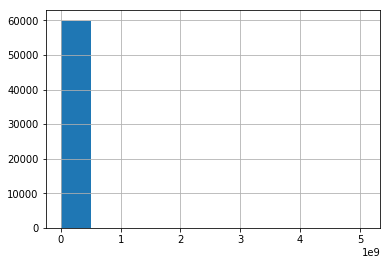

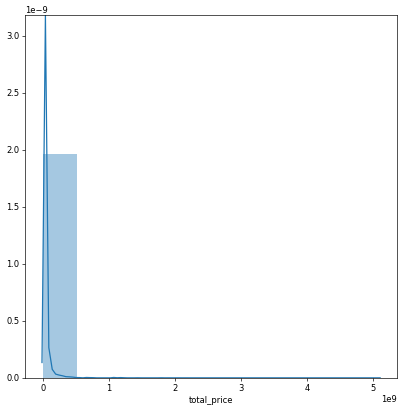

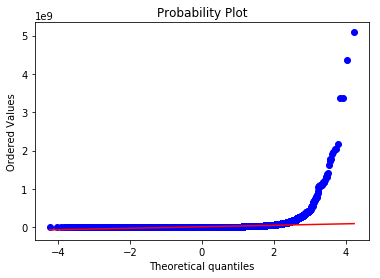

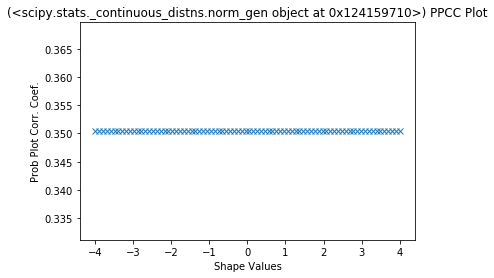

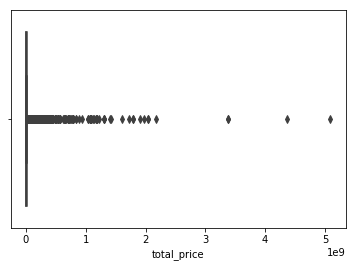

In [5]:
def describe_boxcox_normality(series, bin):
    def describe(series, bin):
        #偏度, 峯度
        print("skewness", stats.skew(series), "\nkurtosis", stats.kurtosis(series)) 
        #描述性統計&百分位數
        print(pd.to_numeric(series).describe([.01, 0.25, 0.50, 0.75, 0.99]))
        #長條圖
        plt.figure()
        series.hist(bins=bin)
        #長條圖計數
        counts, bins = np.histogram(series)
        print(series.value_counts(bins=bin))
        #機率圖
        plt.figure(num=None, figsize=(8, 8), dpi=60, facecolor='w', edgecolor='k')
        sns.distplot(series, bins=bin)
    def boxcox(series):
        lmbda = stats.boxcox(data_train['total_price'])
        print(lmbda)
    def normality(series):
        #QQ-Plot
        plt.figure()
        stats.probplot(series, plot=plt) 
        #PPCC-dPlot
        plt.figure()
        stats.ppcc_plot(series,-4,4,dist=stats.norm,plot=plt)
        #box-plot
        plt.figure()
        sns.boxplot(series)
    describe(series, bin)
    boxcox(series)
    normality(series)
        
def transform(series, lm):
    data_train['log10_total_price'] = np.log10(data_train['total_price'])
    data_train['log100_total_price'] = np.log(data_train['total_price'])/np.log(100)
    data_train['boxcox_total_price'] = stats.boxcox(data_train['total_price'], lmbda=lm)
    data_train['building_dt'] = data_train['txn_dt'] - data_train['building_complete_dt']

    
    
describe_boxcox_normality(data_train['total_price'], 10) #極右偏, Weibull distr.
transform(data_train['total_price'], 0.14897829)

#log10(Y)
# describe(data_train['log10_total_price'], 10)
# normality(data_train['log10_total_price'])

#boxcox
# boxcox(data_train['total_price']) #lmbda=0.14897829
# describe(data_train['boxcox_total_price'], 100)
# normality(data_train['boxcox_total_price']) 


In [27]:
# 改寫型態

#string
strData = ['building_id']
data_train['building_id'] = data_train['building_id'].astype(str)

#category
catData = ['building_material', 'city', 'town', 'village', 'building_type', 'building_use', 'parking_way']
catData.extend([col for col in data_train.columns if '_index_' in col])
for col in catData:
    data_train[col] = data_train[col].astype('category')

data_train.dtypes

building_id                  object
building_material          category
city                       category
txn_dt                        int64
total_floor                   int64
building_type              category
building_use               category
building_complete_dt          int64
parking_way                category
parking_area                float64
parking_price               float64
txn_floor                   float64
land_area                   float64
building_area               float64
town                       category
lat                         float64
lon                         float64
village_income_median       float64
town_population             float64
town_area                   float64
town_population_density     float64
doc_Rate                    float64
master_rate                 float64
bachelor_rate               float64
jobschool_rate              float64
highschool_rate             float64
junior_rate                 float64
elementary_rate             

In [1]:
# 匯入資料
import os
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
pd.set_option('display.max_columns', 500) #設定顯示最大欄數
pd.set_option('display.max_rows', 1000) #設定顯示最大列數
from scipy import stats



#input data
dir_data = "/Users/Hanna/Desktop/_Python/realEstateValution_ESB/dataset/"
data_train_ = pd.read_csv(dir_data + 'train.csv')
data_train = data_train_.fillna(0)
data_test = pd.read_csv(dir_data + 'test.csv')